# 1. Bayes’ Theorem

# $P(H | D) = \frac{P(H) \times P(D | H)}{P(D)}$
### p(H): the prior probability of the hypothesis before we see any data
### p(H | D): the posterior probability of the hypothesis after we observe new data
### p(D | H): likelihood, the probability of data under the hypothesis
### p(D): the probability of data under any hypothesis

# 2. MCMC (Markov chain Monte Carlo)

### Step 1: Start at the current position (i.e., a vector of n-parameter values) in a n-parameters space
### Step 2: Propose to move to a new position (a new vector of n-parameter values)
### Step 3: Accept or reject the proposed movement based on the prior probability at the previous position, the data, and the posterior probability calculated from the data and its prior distributions according to Bayes’ theorem
### Step 4: If the propose is accepted, then move to the new position. Otherwise, don’t move.
### Step 5: If a pre-specified number of steps has not yet been reached, go back to Step 1 to repeat the process. Otherwise, return all accepted positions.

In [2]:
from scipy import stats
import arviz as az
import numpy as np
import matplotlib.pyplot as plt
import pymc3 as pm
import seaborn as sns
import pandas as pd
from theano import shared
from sklearn import preprocessing
import plotly.figure_factory as ff
import plotly.express as px
%matplotlib inline

In [3]:
data = pd.read_csv('/etlstage/PEE_joint/NUS_modules/CS5340/group_data/GME_stock.csv')
data.head()

,date,open_price,high_price,low_price,close_price,volume,adjclose_price
0,2021-01-28,265.000000,483.000000,112.250000,193.600006,58815800.0,193.600006
1,2021-01-27,354.829987,380.000000,249.000000,347.510010,93396700.0,347.510010
2,2021-01-26,88.559998,150.000000,80.199997,147.979996,178588000.0,147.979996
3,2021-01-25,96.730003,159.179993,61.130001,76.790001,177874000.0,76.790001
4,2021-01-22,42.590000,76.760002,42.320000,65.010002,196784300.0,65.010002


In [4]:
df = px.data.tips()
fig = px.scatter(data, x="date", y="close_price",
                   hover_data=data.columns)
fig.show()

In [5]:
df = px.data.tips()
fig = px.scatter(data, x="open_price", y="close_price",
                   hover_data=data.columns)
fig.show()

In [6]:
df = px.data.tips()
fig = px.scatter(data, x="date", y="volume",
                   hover_data=data.columns)
fig.show()

In [7]:
fig = ff.create_distplot([data['close_price'].values], ['close_price'])
fig.show()

In [8]:
# df = data.melt(id_vars=['date_idx'], value_vars=list(data.columns[1:-1]))
# df
# fig = px.scatter(df, x="date_idx", y="value",color="variable",
#                  hover_data=df.columns)
# fig.show()

In [9]:
# df = data.copy()
# df['log_close_price'] = np.log(df.close_price)
# fig = px.scatter(df, x="data_idx", y="log_close_price",
#                  hover_data=df.columns)
# fig.show()

# $ EWMA_{today_{idx}} = \sum_{idx}p_{idx}(1-\alpha)^{today_{idx}-idx}$

In [10]:
data = pd.read_csv('/etlstage/PEE_joint/NUS_modules/CS5340/group_data/GME_stock.csv')
data.head()

,date,open_price,high_price,low_price,close_price,volume,adjclose_price
0,2021-01-28,265.000000,483.000000,112.250000,193.600006,58815800.0,193.600006
1,2021-01-27,354.829987,380.000000,249.000000,347.510010,93396700.0,347.510010
2,2021-01-26,88.559998,150.000000,80.199997,147.979996,178588000.0,147.979996
3,2021-01-25,96.730003,159.179993,61.130001,76.790001,177874000.0,76.790001
4,2021-01-22,42.590000,76.760002,42.320000,65.010002,196784300.0,65.010002


In [11]:
data = data.sort_values(by='date').reset_index(drop=True)
data['EMA'] = data.loc[:,'close_price'].ewm(alpha=0.2,adjust=False).mean()
data['EMA_delay'] = np.nan
data['EMA_delay'][1:] = data.EMA[:-1]
data = data.dropna().reset_index(drop=True)
display(data.head())
data['date_idx'] = data.index
data_train = data[data.date<'2018-00-00']
display(data_train.head())

data_test = data[(data.date>='2018-00-00')&(data.date<'2021-00-00')]
display(data_test.head())

,date,open_price,high_price,low_price,close_price,volume,adjclose_price,EMA,EMA_delay
0,2002-02-14,10.175,10.195,9.925,10.000,2755400.0,6.733003,10.040000,10.05000
1,2002-02-15,10.000,10.025,9.850,9.950,2097400.0,6.699336,10.022000,10.04000
2,2002-02-19,9.900,9.900,9.375,9.550,1852600.0,6.430017,9.927600,10.02200
3,2002-02-20,9.600,9.875,9.525,9.875,1723200.0,6.648838,9.917080,9.92760
4,2002-02-21,9.840,9.925,9.750,9.850,1744200.0,6.632006,9.903664,9.91708


,date,open_price,high_price,low_price,close_price,volume,adjclose_price,EMA,EMA_delay,date_idx
0,2002-02-14,10.175,10.195,9.925,10.000,2755400.0,6.733003,10.040000,10.05000,0
1,2002-02-15,10.000,10.025,9.850,9.950,2097400.0,6.699336,10.022000,10.04000,1
2,2002-02-19,9.900,9.900,9.375,9.550,1852600.0,6.430017,9.927600,10.02200,2
3,2002-02-20,9.600,9.875,9.525,9.875,1723200.0,6.648838,9.917080,9.92760,3
4,2002-02-21,9.840,9.925,9.750,9.850,1744200.0,6.632006,9.903664,9.91708,4


,date,open_price,high_price,low_price,close_price,volume,adjclose_price,EMA,EMA_delay,date_idx
3998,2018-01-02,17.959999,18.290001,17.780001,18.260000,2832700.0,15.953856,18.289523,18.296904,3998
3999,2018-01-03,18.290001,18.370001,17.920000,18.200001,3789200.0,15.901433,18.271619,18.289523,3999
4000,2018-01-04,18.200001,18.379999,17.959999,18.320000,2781300.0,16.006279,18.281295,18.271619,4000
4001,2018-01-05,18.379999,18.730000,18.219999,18.680000,3019000.0,16.320812,18.361036,18.281295,4001
4002,2018-01-08,18.799999,19.400000,18.799999,19.230000,3668400.0,16.801352,18.534829,18.361036,4002


In [12]:
df = px.data.tips()
fig = px.scatter(data_train, x="EMA_delay", y="close_price",
                   hover_data=data.columns)
fig.show()

In [13]:
df = px.data.tips()
fig = px.scatter(data_test, x="EMA_delay", y="close_price",
                   hover_data=data.columns)
fig.show()

# $y_{pred\_tdidx} = \beta_0 + \gamma_0 \times EMA_{tdidx-1}$
# $y_{pred\_tdidx} = \beta_0 + \gamma_0 \times EMA(tdidx-1|\alpha_0)$
# $ EMA(tdidx-1|\alpha_0) = \sum_{idx}p_{idx}(1-\alpha_0)^{today_{idx}-idx}$
# $P(\alpha_0,\beta_0,\gamma_0 | D) = \frac{P(\alpha_0,\beta_0,\gamma_0) \times P(D | \alpha_0,\beta_0,\gamma_0)}{P(D)}$
## $\alpha_0 \sim Beta(\alpha, \beta)$
## $\beta_0 \sim {\mathcal {N}}(\mu ,\sigma ^{2})$
## $\gamma_0 \sim {\mathcal {N}}(\mu ,\sigma ^{2})$

[[0.99841721]] [0.05070855]


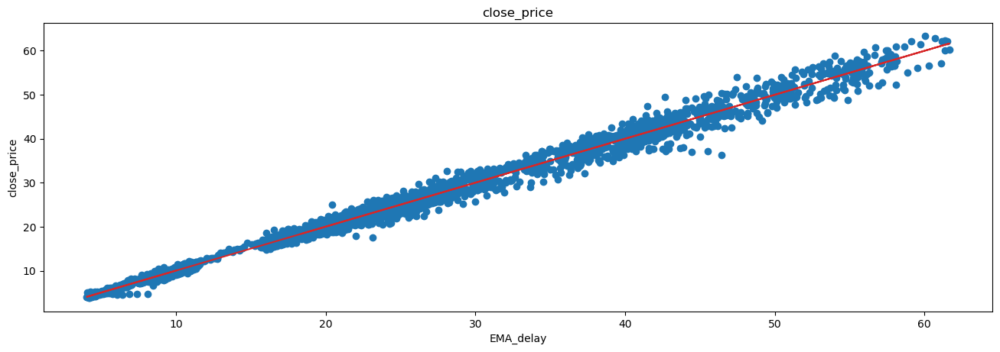

In [14]:
import numpy as np
from sklearn.linear_model import LinearRegression
X_EMA_delay1 = data_train.EMA_delay.values
Y1 = data_train.close_price.values
X_EMA_delay = X_EMA_delay1.reshape(-1, 1)
Y = Y1.reshape(-1, 1)
reg = LinearRegression().fit(X_EMA_delay, Y)
print(reg.coef_, reg.intercept_)

Y_reg = reg.coef_ * X_EMA_delay + reg.intercept_
def plot_df(x, y, y_reg, title="", xlabel='EMA_delay', ylabel='close_price', dpi=100):
    plt.figure(figsize=(16,5), dpi=dpi)
    plt.scatter(x, y, color='tab:blue')
    plt.plot(x, y_reg, color='tab:red')
    plt.gca().set(title=title, xlabel=xlabel, ylabel=ylabel)
    plt.show()
plot_df(x=X_EMA_delay1, y=Y1, y_reg=Y_reg, title='close_price')

In [15]:
data = pd.read_csv('/etlstage/PEE_joint/NUS_modules/CS5340/group_data/GME_stock.csv')
data = data.sort_values(by='date').reset_index(drop=True)
data['date_idx'] = data.index
data_train = data[data.date<'2018-00-00']
display(data_train.head())
data_test = data[(data.date>='2018-00-00')&(data.date<'2021-00-00')]
display(data_test.head())

,date,open_price,high_price,low_price,close_price,volume,adjclose_price,date_idx
0,2002-02-13,9.625,10.060,9.525,10.050,19054000.0,6.766666,0
1,2002-02-14,10.175,10.195,9.925,10.000,2755400.0,6.733003,1
2,2002-02-15,10.000,10.025,9.850,9.950,2097400.0,6.699336,2
3,2002-02-19,9.900,9.900,9.375,9.550,1852600.0,6.430017,3
4,2002-02-20,9.600,9.875,9.525,9.875,1723200.0,6.648838,4


,date,open_price,high_price,low_price,close_price,volume,adjclose_price,date_idx
3999,2018-01-02,17.959999,18.290001,17.780001,18.260000,2832700.0,15.953856,3999
4000,2018-01-03,18.290001,18.370001,17.920000,18.200001,3789200.0,15.901433,4000
4001,2018-01-04,18.200001,18.379999,17.959999,18.320000,2781300.0,16.006279,4001
4002,2018-01-05,18.379999,18.730000,18.219999,18.680000,3019000.0,16.320812,4002
4003,2018-01-08,18.799999,19.400000,18.799999,19.230000,3668400.0,16.801352,4003


In [16]:
def get_EMA(data_train, date_idx,y_label,alpha0=0.2):
    yesterday = date_idx[-1]
    print(alpha0)
    return np.array(data_train[data_train.date_idx<=yesterday].loc[:,y_label].ewm(alpha=alpha0,adjust=False).mean())

In [65]:
def get_EMA(data_train, date_idx,y_label,alpha0=0.2):
    EMA_i = data_train.loc[data_train.index[0],y_label]
    EMA_list = [EMA_i]
    for i in range(data_train.index[1],date_idx-1):
        p_i = data_train.loc[i,y_label]
        #print(f"p_i={p_i}")
        EMA_i = alpha0*p_i + (1-alpha0)*EMA_i
        #print(f"EMA_i={EMA_i}")
        EMA_list.append(EMA_i)
    return EMA_i,EMA_list

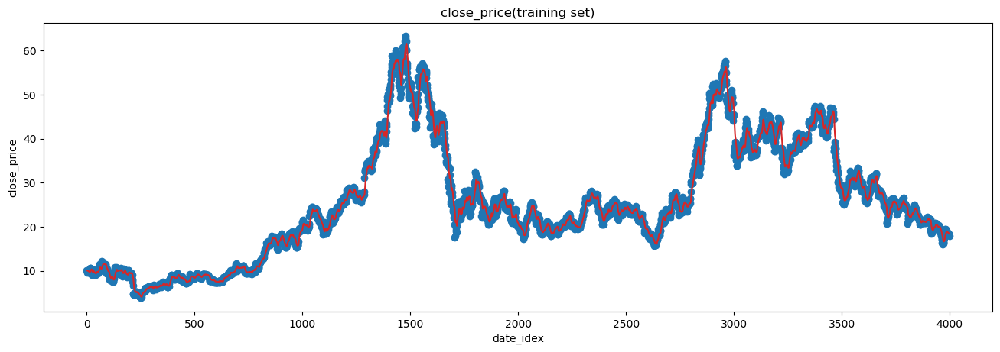

In [66]:
X = data_train.date_idx.values
Y_reg = reg.coef_ * np.array([get_EMA(data_train, x,'close_price',alpha0=0.2)[0] for x in X]) + reg.intercept_
Y1 = data_train.close_price.values

def plot_df(x, y, y_reg, title="", xlabel='date_idex', ylabel='close_price', dpi=100):
    plt.figure(figsize=(16,5), dpi=dpi)
    plt.scatter(x, y, color='tab:blue')
    plt.plot(x, y_reg, color='tab:red')
    plt.gca().set(title=title, xlabel=xlabel, ylabel=ylabel)
    plt.show()
plot_df(x=X, y=Y1, y_reg=Y_reg.reshape(-1, 1), title='close_price(training set)')

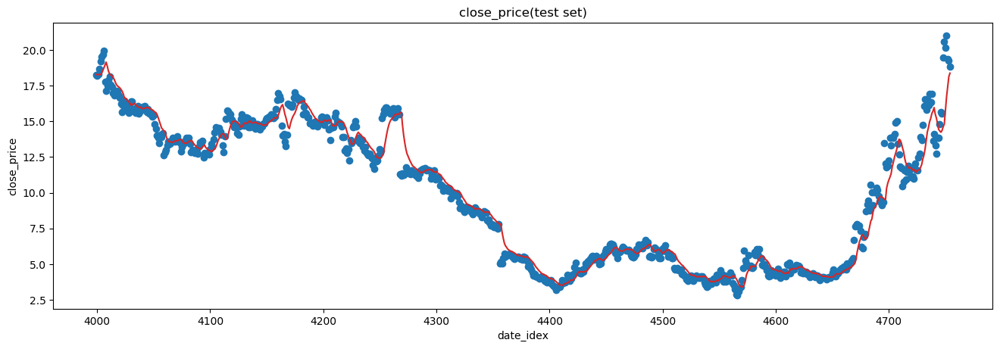

In [67]:
X = data_test.date_idx.values
Y_reg = reg.coef_ * np.array([get_EMA(data_test, x,'close_price',alpha0=0.2)[0] for x in X]) + reg.intercept_
Y1 = data_test.close_price.values

def plot_df(x, y, y_reg, title="", xlabel='date_idex', ylabel='close_price', dpi=100):
    plt.figure(figsize=(16,5), dpi=dpi)
    plt.scatter(x, y, color='tab:blue')
    plt.plot(x, y_reg, color='tab:red')
    plt.gca().set(title=title, xlabel=xlabel, ylabel=ylabel)
    plt.show()
plot_df(x=X, y=Y1, y_reg=Y_reg.reshape(-1, 1), title='close_price(test set)')

In [68]:
X = data_train.date_idx.values
Y = data_train.close_price.values.reshape(-1, 1)

In [74]:
# X = data_train.date_idx.values
# Y = data_train.close_price.values.reshape(-1, 1)

# with pm.Model() as model:
#     alpha0 = 0.2#pm.Beta("alpha", alpha=5, beta=1) # alpha >0.5 => highted weitage to the recnt data
#     beta0 = pm.Normal("beta", mu=-0.0067, sd=0.005)
#     gamma0 = pm.Normal("gamma", mu=0.99, sd=0.1)
    
#     std = pm.Uniform("std", 0, 100)
    
#     mean = pm.Deterministic("mean", beta0 + gamma0 * np.array([get_EMA(data_train, x,'close_price',alpha0=alpha0)[0] for x in X]))
    
#     obs = pm.Normal("obs", mu=mean, sd=std, observed=Y)
    
#     trace = pm.sample(1000, step=pm.Metropolis())
#     burned_trace = trace[200:]

In [75]:
# pm.plots.traceplot(burned_trace, varnames=["std", "beta","gamma", "alpha"])

In [ ]:
pm.plot_posterior(burned_trace, varnames=["std", "beta","gamma", "alpha"])